In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import Lasso
import tensorflow as tf
from tensorflow.keras import layers

### Знакомство с данными, разведочный анализ

In [ ]:
# Прочитаем датасеты и объединим их по первой колонке, тип inner

In [2]:
df_bp = pd.read_excel('X_bp.xlsx')
df_bp

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...
1018,1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [3]:
df_nup = pd.read_excel('X_nup.xlsx')
df_nup

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.000000,57.000000
1,1,0,4.000000,60.000000
2,2,0,4.000000,70.000000
3,3,0,5.000000,47.000000
4,4,0,5.000000,57.000000
...,...,...,...,...
1035,1035,90,8.088111,47.759177
1036,1036,90,7.619138,66.931932
1037,1037,90,9.800926,72.858286
1038,1038,90,10.079859,65.519479


In [4]:
df = df_bp.merge(df_nup, on='Unnamed: 0', how='inner')
df.drop(columns=['Unnamed: 0'], inplace=True)

In [5]:
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [6]:
df.shape

(1023, 13)

In [7]:
# Посмотрим на наличие пропусков

df.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [9]:
# Посмотрим на основные параметры анализа данных

df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [10]:
# Визуализация сырых данных

In [11]:
# Гистограммы распределений и боксплоты

for column in df.columns:
    fig = px.histogram(df, x=column, color_discrete_sequence=['green'], nbins=100, marginal="box")
    fig.show()

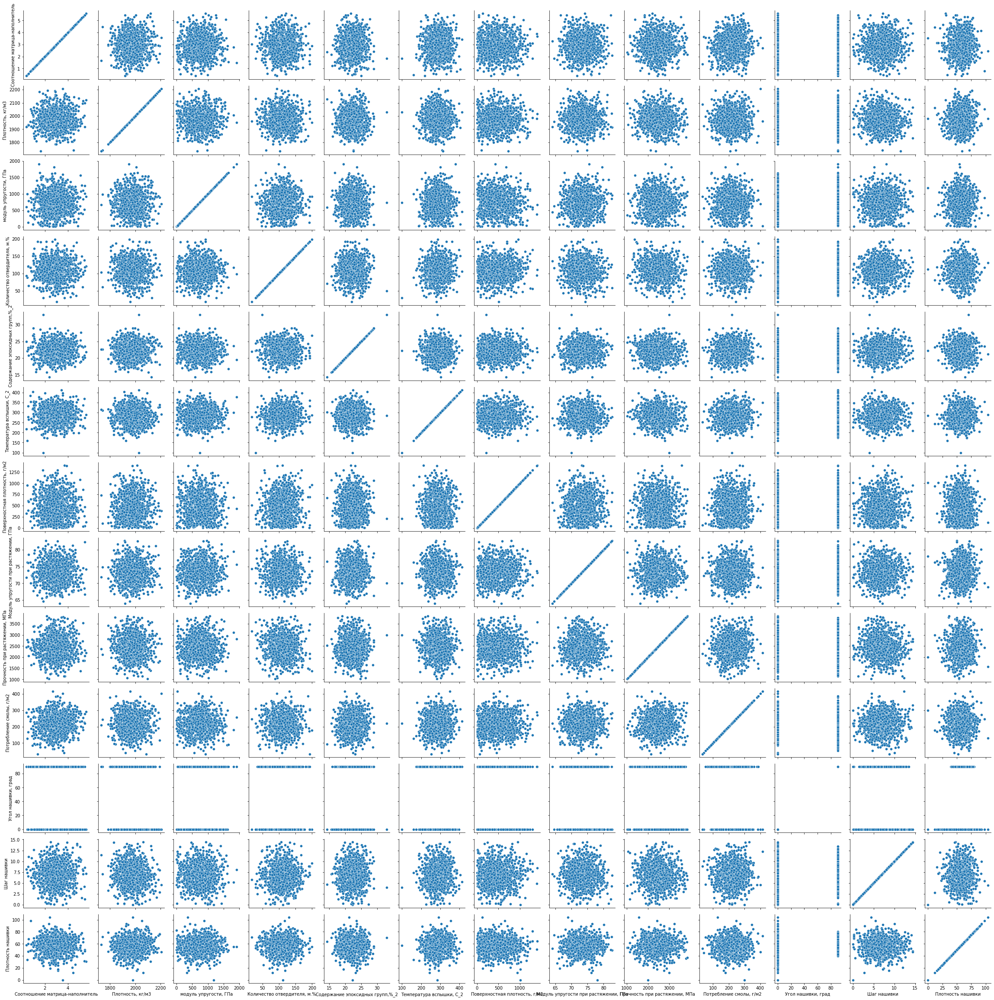

In [31]:
# Попарные скаттерплоты

g = sns.PairGrid(df[df.columns])
g.map(sns.scatterplot)

In [12]:
# Корреляционная матрица

fig = px.imshow(df.corr(), text_auto=True, width=1000, height=1000, aspect="auto", color_continuous_scale='thermal')
fig.update_xaxes(side="top", tickangle=90)
fig.show()

In [ ]:
# Корреляция входных переменных очень слабая

In [13]:
# Удалим выбросы далее 1,5 межквартильных размахов

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3-Q1

df = df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [14]:
# Проверим данные на наличие выбросов после их удаления

for column in df.columns:
    fig = px.box(df, y=column)
    fig.show()

In [15]:
# Нормализация

scaler = preprocessing.MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df_normalized

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.289334,0.557156
1,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.335840
2,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.506083
3,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.557156
4,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.727399
...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,0.361662,0.444480,0.552781,0.337550,0.333908,0.703458,0.161609,0.475147,0.463043,0.207613,1.0,0.660014,0.336177
932,0.607674,0.704373,0.268550,0.749605,0.294428,0.362087,0.271207,0.464422,0.452087,0.182974,1.0,0.768759,0.450768
933,0.573391,0.498274,0.251612,0.501991,0.623085,0.334063,0.572959,0.578740,0.575296,0.585446,1.0,0.301102,0.687046
934,0.662497,0.748688,0.448724,0.717585,0.267818,0.466417,0.496511,0.535142,0.334513,0.451779,1.0,0.458245,0.527552


### Обучить нескольких моделей для прогноза модуля упругости при растяжении и прочности при растяжении. 

In [16]:
# Определим входы и выходы для моделей

target_var_1 = df_normalized['Модуль упругости при растяжении, ГПа']
target_var_2 = df_normalized['Прочность при растяжении, МПа']

train_vars_1 = df_normalized.loc[:, df_normalized.columns != 'Модуль упругости при растяжении, ГПа']
train_vars_2 = df_normalized.loc[:, df_normalized.columns != 'Прочность при растяжении, МПа']

In [17]:
# Разбиваем выборки на обучающую и тестовую

x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(train_vars_1, target_var_1, test_size=0.3, random_state=14)
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(train_vars_2, target_var_2, test_size=0.3, random_state=14)

In [18]:
y_train_1

345    0.917872
489    0.253426
880    0.292574
771    0.330842
300    0.246712
         ...   
327    0.437313
406    0.396594
268    0.468793
344    0.445672
619    0.220254
Name: Модуль упругости при растяжении, ГПа, Length: 655, dtype: float64

In [19]:
y_test_1

682    0.793776
865    0.358305
866    0.380994
129    0.609314
600    0.593984
         ...   
156    0.664776
120    0.218305
678    0.302781
817    0.577438
874    0.638129
Name: Модуль упругости при растяжении, ГПа, Length: 281, dtype: float64

In [20]:
# Проверка правильности разбивки

df_normalized.shape[0] - x_train_1.shape[0] - x_test_1.shape[0]
df_normalized.shape[0] - x_train_2.shape[0] - x_test_2.shape[0]

0

In [21]:
# Будем складывать названия моделей и их ошибки в датафрейм
df_errors = pd.DataFrame(columns=['target_var','model_name','MSE','R2'])

In [22]:
# Зададим функцию для визуализации факт/прогноз для результатов моделей

def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label='Тест')
    plt.plot(predict, label='Прогноз')
    plt.legend(loc='best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()

In [20]:
# Линейная регрессия для модуля упругости при растяжении

linear_reg_1 = LinearRegression()
linear_reg_1.fit(x_train_1, y_train_1)
prediction_y_test_linear_1 = linear_reg_1.predict(x_test_1)

# The mean squared error: MSE of zero (0) represents the fact that the predictor is a perfect predictor.
MSE_1 = mean_squared_error(y_test_1, prediction_y_test_linear_1)
# The coefficient of determination: 1 is perfect prediction
R2_1 = r2_score(y_test_1, prediction_y_test_linear_1)

# Линейная регрессия для прочности при растяжении
linear_reg_2 = LinearRegression()
linear_reg_2.fit(x_train_2, y_train_2)
prediction_y_test_linear_2 = linear_reg_2.predict(x_test_2)

MSE_2 = mean_squared_error(y_test_2, prediction_y_test_linear_2)
R2_2 = r2_score(y_test_2, prediction_y_test_linear_2)


linear_errors = pd.DataFrame({'model_name':'LinearRegression',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_1, MSE_2],\
                               'R2':[R2_1, R2_2]})
df_errors = pd.concat([df_errors, linear_errors], ignore_index=True)
df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041


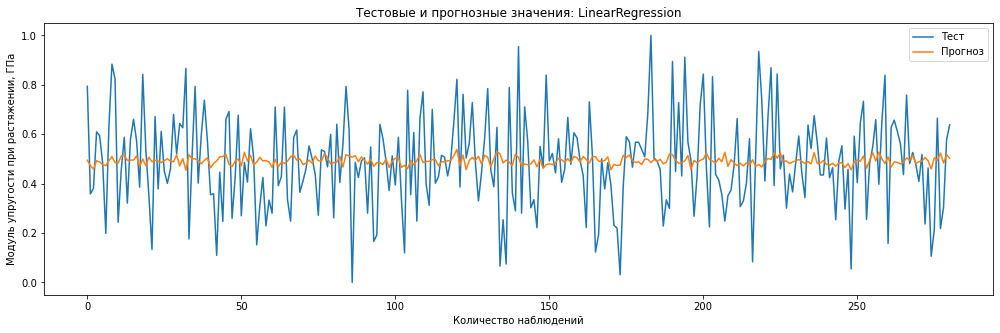

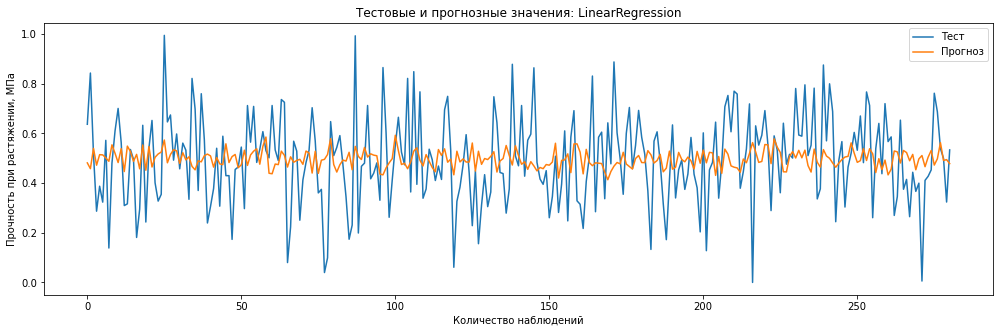

In [74]:
# Отрисуем результат

actual_and_predicted_plot(y_test_1.values, prediction_y_test_linear_1, 'Модуль упругости при растяжении, ГПа', 'LinearRegression')
actual_and_predicted_plot(y_test_2.values, prediction_y_test_linear_2, 'Прочность при растяжении, МПа', 'LinearRegression')

#### Если коэффициент детерминации близок к 0, это значит, что модель прогнозирует данные с таким же результатом, как если бы мы всегда брали среднее значение прогнозируемой переменной

In [ ]:
# Регрессия k-ближайших соседей

In [21]:
%%time

neigh = KNeighborsRegressor()
neigh_params = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

GSCV_neigh_1 = GridSearchCV(neigh, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_1.fit(x_train_1, y_train_1)
# GSCV_neigh_1.best_params_
neigh_1 = GSCV_neigh_1.best_estimator_

MSE_1 = mean_squared_error(y_test_1, neigh_1.predict(x_test_1))
R2_1 = r2_score(y_test_1, neigh_1.predict(x_test_1))

GSCV_neigh_2 = GridSearchCV(neigh, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_2.fit(x_train_2, y_train_2)
# GSCV_neigh_2.best_params_
neigh_2 = GSCV_neigh_2.best_estimator_

MSE_2 = mean_squared_error(y_test_2, neigh_2.predict(x_test_2))
R2_2 = r2_score(y_test_2, neigh_2.predict(x_test_2))


neigh_errors = pd.DataFrame({'model_name':'KNeighborsRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_1, MSE_2],\
                               'R2':[R2_1, R2_2]})
df_errors = pd.concat([df_errors, neigh_errors], ignore_index=True)
df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.035057,0.017077
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.033856,-0.043321


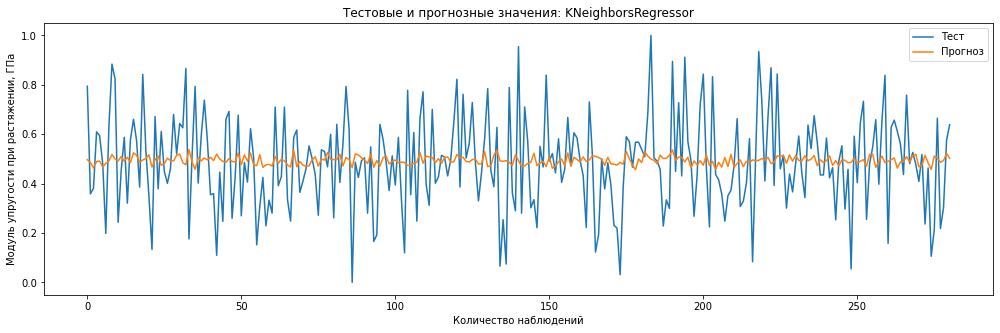

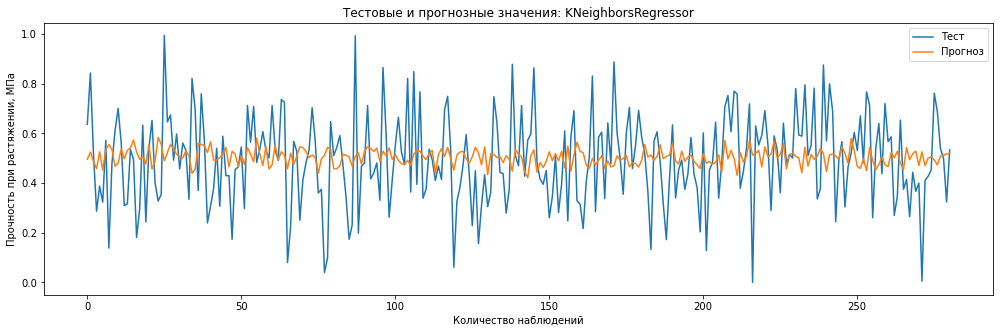

In [75]:
# Отрисуем результат

actual_and_predicted_plot(y_test_1.values, neigh_1.predict(x_test_1), 'Модуль упругости при растяжении, ГПа', 'KNeighborsRegressor')
actual_and_predicted_plot(y_test_2.values, neigh_2.predict(x_test_2), 'Прочность при растяжении, МПа', 'KNeighborsRegressor')

In [ ]:
# Случайный лес, регрессия. 

In [22]:
%%time

regr_rf = RandomForestRegressor(random_state=14)
regr_rf_params = {
    'n_estimators' : range(1, 100, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
    'criterion':['mse']
}
GSCV_regr_rf_1 = GridSearchCV(regr_rf, regr_rf_params, cv=5, verbose=2)
GSCV_regr_rf_1.fit(x_train_1, y_train_1)
# GSCV_regr_rf_1.best_params_
regr_rf_1 = GSCV_regr_rf_1.best_estimator_

MSE_1 = mean_squared_error(y_test_1, regr_rf_1.predict(x_test_1))
R2_1 = r2_score(y_test_1, regr_rf_1.predict(x_test_1))

GSCV_regr_rf_2 = GridSearchCV(regr_rf, regr_rf_params, cv=5, verbose=2)
GSCV_regr_rf_2.fit(x_train_2, y_train_2)
# GSCV_regr_rf_2.best_params_
regr_rf_2 = GSCV_regr_rf_2.best_estimator_

MSE_2 = mean_squared_error(y_test_2, regr_rf_2.predict(x_test_2))
R2_2 = r2_score(y_test_2, regr_rf_2.predict(x_test_2))

rf_errors = pd.DataFrame({'model_name':'RandomForestRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_1, MSE_2],\
                               'R2':[R2_1, R2_2]})
df_errors = pd.concat([df_errors, rf_errors], ignore_index=True)
df_errors

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, ma

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total ti

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total t

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total t

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total t

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total t

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total t

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total t

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total t

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total t

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total t

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total t

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total t

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total t

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total t

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total t

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total t

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total t

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total t

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total t

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total t

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total t

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total t

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total t

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.035057,0.017077
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.033856,-0.043321
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.035708,-0.001175
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.033061,-0.018838


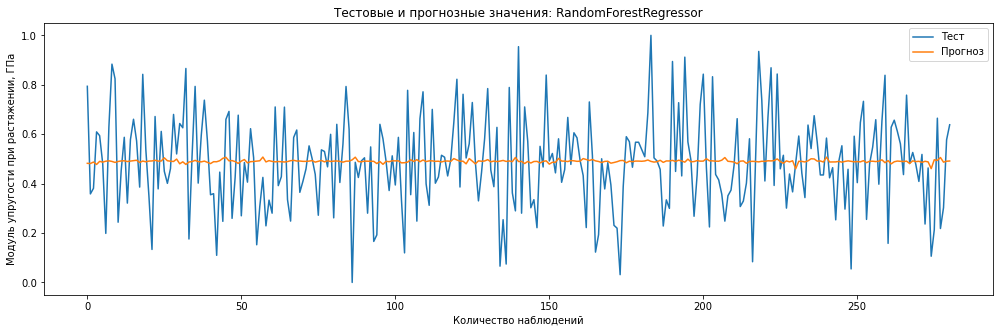

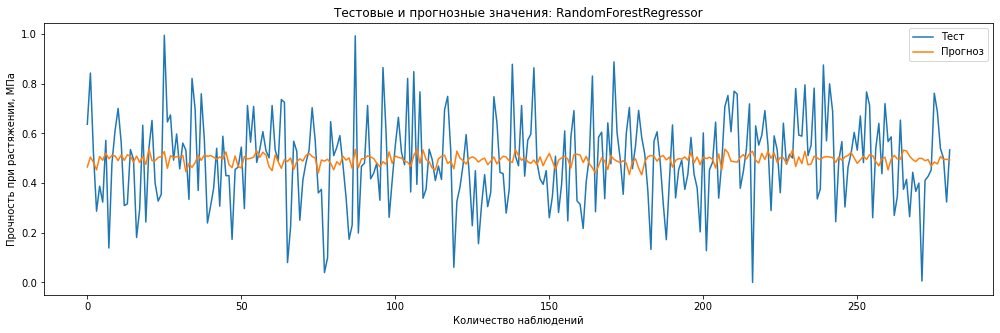

In [76]:
# Отрисуем результат

actual_and_predicted_plot(y_test_1.values, regr_rf_1.predict(x_test_1), 'Модуль упругости при растяжении, ГПа', 'RandomForestRegressor')
actual_and_predicted_plot(y_test_2.values, regr_rf_2.predict(x_test_2), 'Прочность при растяжении, МПа', 'RandomForestRegressor')

In [ ]:
# Многослойный перцептрон

In [24]:
%%time

neuronet = MLPRegressor(random_state=14)
neuronet_params = {
    'hidden_layer_sizes' : [(100, 100, 50, 25, 12), (144, 144, 72, 36, 12, 1), (12, 12, 12, 12, 12),
                            (144, 144, 144, 72, 72, 36, 36), ()],
    'activation' : ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['sgd', 'adam'],
    'max_iter' : [100],
    'learning_rate' : ['constant', 'adaptive', 'invscaling']
}

GSCV_neuronet_1 = GridSearchCV(neuronet, neuronet_params, n_jobs=-1, cv=10)
GSCV_neuronet_1.fit(x_train_1, y_train_1)
# GSCV_neuronet_1.best_params_
neuronet_1 = GSCV_neuronet_1.best_estimator_

MSE_1 = mean_squared_error(y_test_1, neuronet_1.predict(x_test_1))
R2_1 = r2_score(y_test_1, neuronet_1.predict(x_test_1))

GSCV_neuronet_2 = GridSearchCV(neuronet, neuronet_params, n_jobs=-1, cv=10)
GSCV_neuronet_2.fit(x_train_2, y_train_2)
# GSCV_neuronet_2.best_params_
neuronet_2 = GSCV_neuronet_2.best_estimator_

MSE_2 = mean_squared_error(y_test_2, neuronet_2.predict(x_test_2))
R2_2 = r2_score(y_test_2, neuronet_2.predict(x_test_2))

neuronet_errors = pd.DataFrame({'model_name':'MLPRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_1, MSE_2],\
                               'R2':[R2_1, R2_2]})
df_errors = pd.concat([df_errors, neuronet_errors], ignore_index=True)
df_errors

Wall time: 18min 30s


,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.035057,0.017077
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.033856,-0.043321
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.035708,-0.001175
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.033061,-0.018838
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.035717,-0.001440
7,"Прочность при растяжении, МПа",MLPRegressor,0.034627,-0.067105


In [25]:
# посмотрим на лучшие параметры нейросети по сетке
GSCV_neuronet_1.best_params_

{'activation': 'logistic',
 'hidden_layer_sizes': (100, 100, 50, 25, 12),
 'learning_rate': 'constant',
 'max_iter': 100,
 'solver': 'adam'}

In [26]:
GSCV_neuronet_2.best_params_

{'activation': 'tanh',
 'hidden_layer_sizes': (100, 100, 50, 25, 12),
 'learning_rate': 'constant',
 'max_iter': 100,
 'solver': 'adam'}

In [79]:
neuronet_1.predict(x_test_1)

array([0.49196488, 0.4919956 , 0.49193314, 0.49193464, 0.49194575,
       0.4919497 , 0.49194468, 0.49194626, 0.49194476, 0.49196375,
       0.49194037, 0.49196253, 0.49195269, 0.49190778, 0.4919508 ,
       0.49196986, 0.49194514, 0.49192934, 0.49193399, 0.49193291,
       0.49197328, 0.49197882, 0.49193881, 0.4919465 , 0.49195458,
       0.49194745, 0.49197128, 0.49195021, 0.49190891, 0.49194082,
       0.49195419, 0.49192842, 0.49197554, 0.49199313, 0.49197509,
       0.49195749, 0.49195752, 0.49199071, 0.49197055, 0.49199078,
       0.49193578, 0.49194613, 0.49197692, 0.49195021, 0.49196428,
       0.49192134, 0.49193351, 0.49193052, 0.49195429, 0.4919544 ,
       0.49195694, 0.4919457 , 0.49196906, 0.49196737, 0.49194039,
       0.49192904, 0.49197997, 0.49194019, 0.49193932, 0.49194751,
       0.4919426 , 0.491982  , 0.49192495, 0.49197119, 0.49193129,
       0.49195446, 0.49193407, 0.49195103, 0.49194932, 0.4919669 ,
       0.49197566, 0.49197166, 0.49193243, 0.49199003, 0.49199

#### Прогнозные значения различаются только в пятом знаке после запятой. Результат плохой.

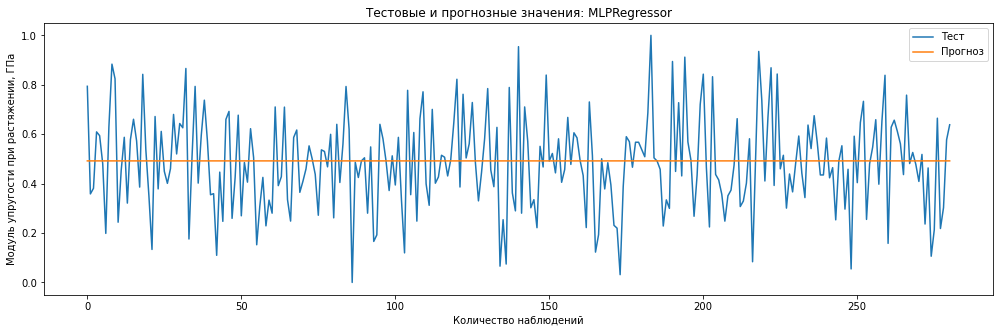

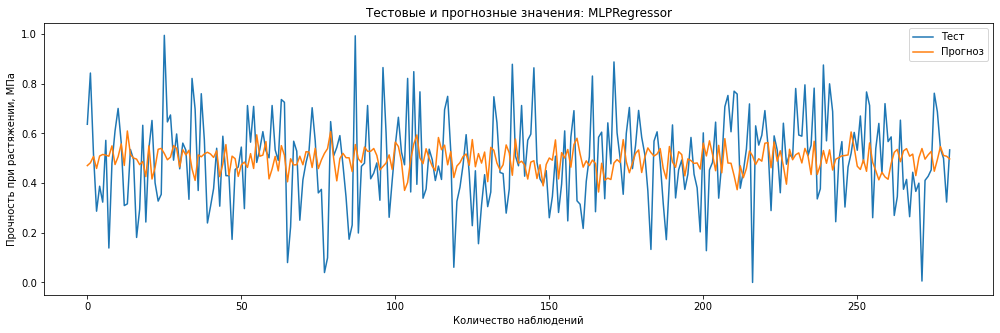

In [77]:
# Отрисуем результат

actual_and_predicted_plot(y_test_1.values, neuronet_1.predict(x_test_1), 'Модуль упругости при растяжении, ГПа', 'MLPRegressor')
actual_and_predicted_plot(y_test_2.values, neuronet_2.predict(x_test_2), 'Прочность при растяжении, МПа', 'MLPRegressor')

In [ ]:
# Лассо регрессия

In [27]:
lasso = Lasso(random_state=14)
lasso_params = {
   'alpha': np.linspace(0, 1, 100)
}
GSCV_lasso_1 = GridSearchCV(lasso, lasso_params, cv=10, verbose=2)
GSCV_lasso_1.fit(x_train_1, y_train_1)
# GSCV_lasso_1.best_params_ 

lasso_1 = GSCV_lasso_1.best_estimator_

MSE_1 = mean_squared_error(y_test_1, lasso_1.predict(x_test_1))
R2_1 = r2_score(y_test_1, lasso_1.predict(x_test_1))

GSCV_lasso_2 = GridSearchCV(lasso, lasso_params, cv=10, verbose=2)
GSCV_lasso_2.fit(x_train_2, y_train_2)
# GSCV_lasso_2.best_params_ 

lasso_2 = GSCV_lasso_2.best_estimator_
MSE_2 = mean_squared_error(y_test_2, lasso_2.predict(x_test_2))
R2_2 = r2_score(y_test_2, lasso_2.predict(x_test_2))

lasso_errors = pd.DataFrame({'model_name':'Lasso',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_1, MSE_2],\
                               'R2':[R2_1, R2_2]})
df_errors = pd.concat([df_errors, lasso_errors], ignore_index=True)
df_errors

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s


C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.610971878075825, tolerance: 0.002149047248893736
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estima

[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END ...................

C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.685588498480246, tolerance: 0.0021572284770209663
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  mo

[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.4747474747474748; total time=   0.0s
[CV] END ...........................alpha=0.4747474747474748; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...........................alpha=0.6161616161616162; total time=   0.0s
[CV] END ...........................alpha=0.6161616161616162; total time=   0.0s
[CV] END ...........................alpha=0.6161616161616162; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.7272727272727273; total time=   0.0s
[CV] END ...........................alpha=0.7272727272727273; total time=   0.0s
[CV] END ...........................alpha=0.7272727272727273; total time=   0.0s
[CV] END ...........................alpha=0.7272727272727273; total time=   0.0s
[CV] END ...........................alpha=0.7272727272727273; total time=   0.0s
[CV] END ...........................alpha=0.7272727272727273; total time=   0.0s
[CV] END ...........................alpha=0.7373737373737375; total time=   0.0s
[CV] END ...........................alpha=0.7373737373737375; total time=   0.0s
[CV] END ...........................alpha=0.7373737373737375; total time=   0.0s
[CV] END ...........................alpha=0.7373737373737375; total time=   0.0s
[CV] END ...........................alpha=0.7373737373737375; total time=   0.0s
[CV] END ...........................alpha=0.7373737373737375; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.8383838383838385; total time=   0.0s
[CV] END ...........................alpha=0.8383838383838385; total time=   0.0s
[CV] END ...........................alpha=0.8383838383838385; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...........................alpha=0.8484848484848485; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...................

C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.419365355178039, tolerance: 0.0021581827649665934
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estim

[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END ...................

C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.506500652197477, tolerance: 0.002181755188555051
  model = cd_fast.enet_coordinate_descent(
C:\Users\hohlo\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estima

[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.13131313131313133; total time=   0.0s
[CV] END ..........................alpha=0.13131313131313133; total time=   0.0s
[CV] END ..........................alpha=0.13131313131313133; total time=   0.0s
[CV] END ..........................alpha=0.13131313131313133; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.27272727272727276; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.37373737373737376; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ..........................alpha=0.38383838383838387; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ..........................alpha=0.48484848484848486; total time=   0.0s
[CV] END ............................alpha=0.494949494949495; total time=   0.0s
[CV] END ............................alpha=0.494949494949495; total time=   0.0s
[CV] END ............................alpha=0.494949494949495; total time=   0.0s
[CV] END ............................alpha=0.494949494949495; total time=   0.0s
[CV] END ............................alpha=0.494949494949495; total time=   0.0s
[CV] END ............................alpha=0.494949494949495; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.5858585858585859; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ............................alpha=0.595959595959596; total time=   0.0s
[CV] END ...........................alpha=0.6060606060606061; total time=   0.0s
[CV] END ...................

[CV] END ............................alpha=0.696969696969697; total time=   0.0s
[CV] END ............................alpha=0.696969696969697; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...........................alpha=0.7070707070707072; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.8181818181818182; total time=   0.0s
[CV] END ...........................alpha=0.8181818181818182; total time=   0.0s
[CV] END ...........................alpha=0.8181818181818182; total time=   0.0s
[CV] END ...........................alpha=0.8181818181818182; total time=   0.0s
[CV] END ...........................alpha=0.8181818181818182; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...........................alpha=0.8282828282828284; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9494949494949496; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...........................alpha=0.9595959595959597; total time=   0.0s
[CV] END ...................

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.035057,0.017077
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.033856,-0.043321
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.035708,-0.001175
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.033061,-0.018838
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.035717,-0.001440
7,"Прочность при растяжении, МПа",MLPRegressor,0.034627,-0.067105
8,"Модуль упругости при растяжении, ГПа",Lasso,0.035697,-0.000872
9,"Прочность при растяжении, МПа",Lasso,0.032464,-0.000439


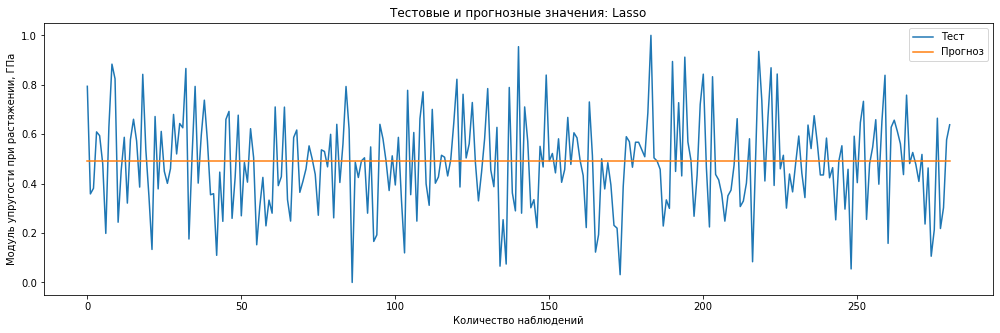

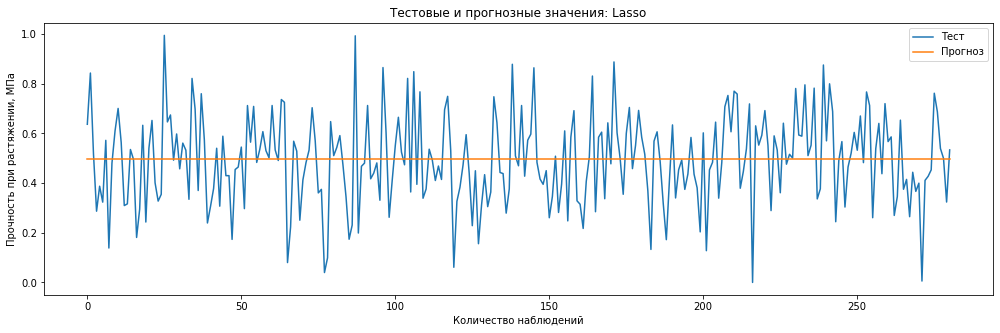

In [80]:
# Отрисуем результат

actual_and_predicted_plot(y_test_1.values, lasso_1.predict(x_test_1), 'Модуль упругости при растяжении, ГПа', 'Lasso')
actual_and_predicted_plot(y_test_2.values, lasso_2.predict(x_test_2), 'Прочность при растяжении, МПа', 'Lasso')

In [28]:
# Итого датасет с ошибками

df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.035057,0.017077
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.033856,-0.043321
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.035708,-0.001175
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.033061,-0.018838
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.035717,-0.001440
7,"Прочность при растяжении, МПа",MLPRegressor,0.034627,-0.067105
8,"Модуль упругости при растяжении, ГПа",Lasso,0.035697,-0.000872
9,"Прочность при растяжении, МПа",Lasso,0.032464,-0.000439


### Написать нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель. 

In [29]:
# Определим входы и выход для модели

target_var = df['Соотношение матрица-наполнитель']
train_vars = df.loc[:, df.columns != 'Соотношение матрица-наполнитель']

# Разбиваем выборки на обучающую и тестовую
x_train, x_test, y_train, y_test = train_test_split(train_vars, target_var, test_size=0.3, random_state=14)

In [30]:
# нормализация

x_train_normalizer = tf.keras.layers.Normalization(axis=-1)
x_train_normalizer.adapt(np.array(x_train))

In [31]:
# Сконфигурируем модель, зададим слои

model = tf.keras.Sequential([x_train_normalizer, layers.Dense(128, activation='relu'), 
                                                 layers.Dense(128, activation='relu'),                                                  
                                                 layers.Dense(128, activation='relu'),
                                                 layers.Dense(64, activation='relu'),
                                                 layers.Dense(32, activation='relu'),
                                                 layers.Dense(16, activation='relu'),
                                                 layers.Dense(1)
                                                ])

model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='mean_squared_error')   

In [32]:
# Архитектура модели

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense (Dense)               (None, 128)               1664      
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dense_3 (Dense)             (None, 128)               16512     
                                                                 
 dense_4 (Dense)             (None, 64)                8256      
                                                        

In [33]:
# Обучим модель

model_hist = model.fit(x_train, y_train, epochs=100, verbose=1, validation_split = 0.2)

Epoch 1/100
17/17 [==============================] - 1s 29ms/step - loss: 4.6346 - val_loss: 2.5032
Epoch 2/100
17/17 [==============================] - 0s 6ms/step - loss: 1.3399 - val_loss: 1.3215
Epoch 3/100
17/17 [==============================] - 0s 6ms/step - loss: 1.0141 - val_loss: 1.1482
Epoch 4/100
17/17 [==============================] - 0s 6ms/step - loss: 0.9047 - val_loss: 1.1769
Epoch 5/100
17/17 [==============================] - 0s 6ms/step - loss: 0.8800 - val_loss: 1.1513
Epoch 6/100
17/17 [==============================] - 0s 6ms/step - loss: 0.7939 - val_loss: 1.2138
Epoch 7/100
17/17 [==============================] - 0s 6ms/step - loss: 0.7769 - val_loss: 1.1897
Epoch 8/100
17/17 [==============================] - 0s 6ms/step - loss: 0.7341 - val_loss: 1.1500
Epoch 9/100
17/17 [==============================] - 0s 6ms/step - loss: 0.6692 - val_loss: 1.1686
Epoch 10/100
17/17 [==============================] - 0s 6ms/step - loss: 0.6234 - val_loss: 1.1702
Epoch 11

17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - val_loss: 1.2629
Epoch 84/100
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - val_loss: 1.2352
Epoch 85/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - val_loss: 1.2663
Epoch 86/100
17/17 [==============================] - 0s 6ms/step - loss: 0.0028 - val_loss: 1.2397
Epoch 87/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.2638
Epoch 88/100
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - val_loss: 1.2505
Epoch 89/100
17/17 [==============================] - 0s 6ms/step - loss: 9.2560e-04 - val_loss: 1.2500
Epoch 90/100
17/17 [==============================] - 0s 6ms/step - loss: 7.9275e-04 - val_loss: 1.2495
Epoch 91/100
17/17 [==============================] - 0s 5ms/step - loss: 7.2893e-04 - val_loss: 1.2483
Epoch 92/100
17/17 [==============================] - 0s 5ms/step - loss: 7.3510e-04 - val_loss: 1.24

In [34]:
# Потери модели

model_hist.history

{'loss': [4.634558200836182,
  1.3399014472961426,
  1.0141079425811768,
  0.9046779274940491,
  0.8799526691436768,
  0.7939117550849915,
  0.7768723964691162,
  0.7341343760490417,
  0.6692450046539307,
  0.6233661770820618,
  0.6070664525032043,
  0.5411015748977661,
  0.4484245181083679,
  0.39742717146873474,
  0.37532132863998413,
  0.301240473985672,
  0.2622360289096832,
  0.21301928162574768,
  0.16482163965702057,
  0.1416412889957428,
  0.11760133504867554,
  0.08805297315120697,
  0.06661992520093918,
  0.0506574772298336,
  0.05061866343021393,
  0.03985195234417915,
  0.03453054651618004,
  0.026034565642476082,
  0.018988508731126785,
  0.016053644940257072,
  0.013995538465678692,
  0.01321985200047493,
  0.012766150757670403,
  0.013583824038505554,
  0.015815483406186104,
  0.01616806350648403,
  0.01256120391190052,
  0.00948144681751728,
  0.008849319070577621,
  0.007903520949184895,
  0.006341943517327309,
  0.007334025576710701,
  0.006380723789334297,
  0.004986

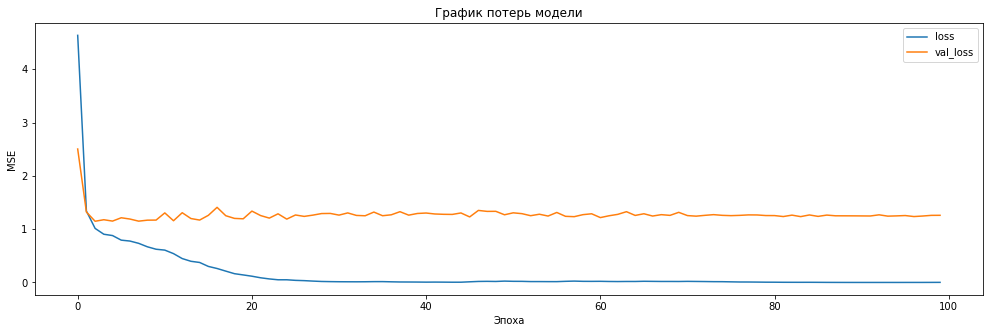

In [35]:
# Отрисовка потерь на тренировочной и тестовой выборках
def model_loss_plot(model_hist):
    plt.figure(figsize=(17,5))
    plt.plot(model_hist.history['loss'])
    plt.plot(model_hist.history['val_loss'])
    plt.title('График потерь модели')
    plt.ylabel('MSE')
    plt.xlabel('Эпоха')
    plt.legend(['loss', 'val_loss'], loc='best')
    plt.show()
model_loss_plot(model_hist)

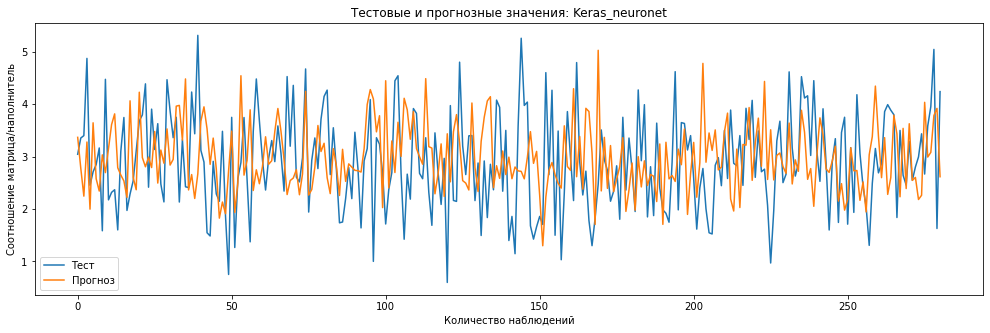

In [82]:
# Отрисуем результат работы модели

actual_and_predicted_plot(y_test.values, model.predict(x_test.values), 'Cоотношение матрица/наполнитель', 'Keras_neuronet')

In [37]:
# оценка модели MSE
model.evaluate(x_test, y_test, verbose=1)

9/9 [==============================] - 0s 2ms/step - loss: 1.2517


1.251726746559143

In [39]:
# Добавим ошибки модели в датасет с ошибками

MSE = mean_squared_error(y_test, model.predict(x_test.values))
R2 = r2_score(y_test, model.predict(x_test.values))

keras_neuronet_errors = pd.DataFrame({'model_name':'Keras_neuronet',\
                                    'target_var':['Соотношение матрица/наполнитель'],\
                                    'MSE':[MSE],\
                                    'R2':[R2]})
df_errors = pd.concat([df_errors, keras_neuronet_errors], ignore_index=True)
df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.035136,0.014854
1,"Прочность при растяжении, МПа",LinearRegression,0.033425,-0.030041
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.035057,0.017077
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.033856,-0.043321
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.035708,-0.001175
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.033061,-0.018838
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.035717,-0.001440
7,"Прочность при растяжении, МПа",MLPRegressor,0.034627,-0.067105
8,"Модуль упругости при растяжении, ГПа",Lasso,0.035697,-0.000872
9,"Прочность при растяжении, МПа",Lasso,0.032464,-0.000439


In [110]:
# Сохраним модель для разработки веб-приложения для прогнозирования соотношения "матрица-наполнитель" в фреймворке Flask

model.save('flaskProject/saved_models/keras_model')

INFO:tensorflow:Assets written to: flaskProject/saved_models/keras_model\assets
